In [54]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
import geopy.distance
import seaborn as sns
from scipy import stats
from matplotlib import animation
import io
import base64
from IPython.display import HTML
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings
warnings.filterwarnings("ignore")
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim
import re
from matplotlib.pyplot import *
import itertools
from geopy.geocoders import Nominatim
import re

In [2]:
taxi_green_df = pd.read_csv('summary/nyc_taxi_green_2015_combine_1000000_filter.csv')
taxi_yellow_df = pd.read_csv('summary/nyc_taxi_yellow_2015_combine_1000000_filter.csv')

In [3]:
print('size for green taxi: {}'.format(taxi_green_df.shape))
print('size for yellow taxi: {}'.format(taxi_yellow_df.shape))

size for green taxi: (996380, 32)
size for yellow taxi: (983697, 31)


In [4]:
LL = (-74.30, -73.70, 40.56, 40.90)

# 1. Cluster the pickup and dropoff coordinates

Since a lot of trips run between transportation hubs or popular areas (taxi driver sometimes would also prefer to take passengers to places that they can have a return ride), I will combine the pickup and dropoff coordinates together to perform K-means clustering.

## 1.1 K-means clustering
reference: https://scikit-learn.org/stable/modules/clustering.html#k-means

In [5]:
def cluster_kmeans(df, n_clusters, n_init):
    longitude = list(df.pickup_longitude) + list(df.dropoff_longitude)
    latitude = list(df.pickup_latitude) + list(df.dropoff_latitude)
    loc_df = pd.DataFrame()
    loc_df['longitude'] = longitude
    loc_df['latitude'] = latitude
    
    kmeans = KMeans(n_clusters = n_clusters, n_init=n_init, random_state=123)
    kmeans.fit(loc_df)
    df['pick_cl'] = kmeans.labels_[:df.shape[0]]
    df['drop_cl'] = kmeans.labels_[df.shape[0]:]
    centroid_pick = pd.DataFrame(kmeans.cluster_centers_, columns = ['centroid_pick_long', 'centroid_pick_lat'])
    centroid_pick['pick_cl'] = centroid_pick.index
    centroid_drop = pd.DataFrame(kmeans.cluster_centers_, columns = ['centroid_drop_long', 'centroid_drop_lat'])
    centroid_drop['drop_cl'] = centroid_drop.index
    df_cl = pd.merge(df, centroid_pick, how = 'left', left_on = 'pick_cl', right_on = 'pick_cl')
    df_cl = pd.merge(df_cl, centroid_drop, how = 'left', left_on = 'drop_cl', right_on = 'drop_cl')
    return df_cl, kmeans, centroid_pick

In [6]:
cl_green_df, kmeans_green, centroid_green = cluster_kmeans(df = taxi_green_df, n_clusters = 15, n_init = 10)

I used Geocoder to convert trip coordinates to address.
reference: https://geocoder.readthedocs.io/

In [7]:
def get_geocode(coord):
    geolocator = Nominatim()
    addr = geolocator.reverse(coord, timeout=60).address
    if addr == None:
        zipcode = 'NaN'
        zone = 'NaN'
        county = 'NaN'
    else:
        strs = [x.strip() for x in addr.split(',')]
        num = str(re.findall(r"\D(\d{5})\D", addr))
        num = str(filter(str.isdigit, num))[:5]
        zipcode = num
        county = strs[-5]
        if strs[-6]=='Manhattan' or strs[-6]=='BK':
            zone = strs[-7]
        else:
            zone = strs[-6]
    return zipcode+','+zone + ',' + county
 
def get_neighborhood(zone):
    return zone.split(',')[1]
def get_county(zone):
    return zone.split(',')[2]

In [8]:
def centroid_pick_info(centroid_df):
    geolocator = Nominatim()
    centroid_df['centroid_pick_long2'] = centroid_df['centroid_pick_long'].astype(str)
    centroid_df['centroid_pick_lat2'] = centroid_df['centroid_pick_lat'].astype(str)
    centroid_df['pickup_coord']=centroid_df[['centroid_pick_lat2', 'centroid_pick_long2']].apply(lambda x: ",".join(x), axis=1)
    
    centroid_df['pickup_zone'] = centroid_df['pickup_coord'].apply(get_geocode)
    centroid_df['pickup_neighborhood'] = centroid_df['pickup_zone'].apply(get_neighborhood)
    centroid_df['pickup_county'] = centroid_df['pickup_zone'].apply(get_county)
    
    centroid_df = centroid_df.drop(['pickup_coord', 'pickup_zone', 'centroid_pick_long2','centroid_pick_lat2'], axis=1)
    return centroid_df

In [9]:
centroid_green = centroid_pick_info(centroid_green)

In [10]:
centroid_green.head()
# green_cls_label = ['NYU (Manhattan)', 'Upper East Side \n(Manhattan)', 'Forest Hills \n(Queens)','University Heights \n(Bronx)','Williamsburg \n(Brooklyn)', 'Prospect Heights \n(Brooklyn)','Boerum Hill Historic \nDistrict (Brooklyn)','Queens Plaza \n(Queens)','Macombs Dam \nBridge (Harlem)','Sutphin Boulevard \n(Queens)','Midwood (Brooklyn)', 'Harlem (Manhattan)','Bronx Zoo (Bronx)', 'Jackson Heights \n(Queens)','Bed-Stuy Gateway \nBID (Brooklyn)']

,centroid_pick_long,centroid_pick_lat,pick_cl,pickup_neighborhood,pickup_county
0,-73.997082,40.729980,0,Manhattan Community Board 2,New York County
1,-73.970010,40.765658,1,Manhattan Community Board 8,New York County
2,-73.840559,40.731200,2,Queens,Queens County
3,-73.906375,40.860567,3,The Bronx,Bronx County
4,-73.954440,40.718469,4,Williamsburg,Kings County


The information provided by Geocoder provides an approximate address of the corresponding coordinate, but the 'neighborhood' doesn't provide detailed information for areas like Queens and Bronx. The 'Manhattan Community Board' is also not very informative. In order to have a better idea of the address for each cluster centroid, I used the following link:
<br>https://www.openstreetmap.org/export#map=16/40.7115/-74.0103

* Cluster0: 'NYU (Manhattan)'
* Cluster1: 'Upper East Side (Manhattan)'
* Cluster2: 'Forest Hills (Queens)'
* Cluster3: 'University Heights (Bronx)'
* Cluster4: 'Williamsburg (Brooklyn)'
* Cluster5: 'Prospect Heights (Brooklyn)'
* Cluster6: 'Boerum Hill Historic District (Brooklyn)'
* Cluster7: 'Queens Plaza (Queens)'
* Cluster8: 'Macombs Dam Bridge (Harlem)'
* Cluster9: 'Sutphin Boulevard (Queens)'
* Cluster10: 'Midwood (Brooklyn)'
* Cluster11: 'Harlem (Manhattan)'
* Cluster12: 'Bronx Zoo (Bronx)'
* Cluster13: 'Jackson Heights (Queens)'
* Cluster14: 'Bed-Stuy Gateway BID (Brooklyn)'

In [5]:
# cl_green_df.to_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_joint.csv', index = False)
# centroid_green.to_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_joint_centroid.csv', index = False)
cl_green_df = pd.read_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_joint.csv')
centroid_green = pd.read_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_joint_centroid.csv')

In [ ]:
cl_yellow_df, kmeans_yellow, centroid_yellow = cluster_kmeans(df = taxi_yellow_df, n_clusters = 15, n_init = 10)

In [58]:
centroid_yellow = centroid_pick_info(centroid_yellow)

In [59]:
centroid_yellow.head()
# yellow_cls_label = ['Midtown East \n(53rd Str, Manhattan)','JFK','LGA','Lower East Side \n(Manhattan)','Upper West Side \n(Manhattan)','Columbus Circle \n(Manhattan)','City Hall \n(Manhattan)','Greenpoint \n(Brooklyn)', 'Upper East Side \n(Manhattan)','West Village \n(Manhattan)', 'Park Slope \n(Brooklyn)', 'Queens Plaza \n(Queens)', 'Harlem (Manhattan)', 'Newark', 'Herald Square \n(Manhattan)']

,centroid_pick_long,centroid_pick_lat,pick_cl,pickup_neighborhood,pickup_county
0,-73.970904,40.758370,0,Manhattan Community Board 5,Manhattan
1,-73.785568,40.650669,1,Queens,Queens County
2,-73.866041,40.767613,2,Queens,Queens County
3,-73.989217,40.726891,3,Manhattan Community Board 3,New York County
4,-73.972497,40.789891,4,Manhattan Community Board 7,New York County


* Cluster0: 'Midtown East (53rd Str, Manhattan)'
* Cluster1: 'JFK'
* Cluster2: 'LGA'
* Cluster3: 'Lower East Side (Manhattan)'
* Cluster4: 'Upper West Side (Manhattan)'
* Cluster5: 'Columbus Circle (Manhattan)'
* Cluster6: 'City Hall (Manhattan)'
* Cluster7: 'Greenpoint (Brooklyn)'
* Cluster8: 'Upper East Side (Manhattan)'
* Cluster9: 'West Village (Manhattan)'
* Cluster10: 'Park Slope (Brooklyn)'
* Cluster11: 'Queens Plaza (Queens)'
* Cluster12: 'Harlem (Manhattan)'
* Cluster13: 'Newark'
* Cluster14: 'Herald Square (Manhattan)'

In [6]:
# cl_yellow_df.to_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_joint.csv', index = False)
# centroid_yellow.to_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_joint_centroid.csv', index = False)
cl_yellow_df = pd.read_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_joint.csv')
centroid_yellow = pd.read_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_joint_centroid.csv')

## 1.2 Visualization of clustering result

### 1.2.1 Individual visualization of pickup and dropoff coordinates

In [7]:
LL = (-74.30, -73.70, 40.56, 40.90)

In [23]:
def plot_cluster(df, taxi, centroid, plot_centroid = False):
    def get_cmap(n, name='tab20'):   ## name = 'hsv'
        return plt.cm.get_cmap(name, n)
    cluster_n = len(df.pick_cl.unique())
    cl_to_label_dict = {i:'cluster'+str(i) for i in np.arange(cluster_n)}
    color_list = get_cmap(cluster_n, name = 'tab20')
    colors = {'green':'#59b300', 'yellow':'#ff9900'}
    fig, axs = plt.subplots(1, 2, figsize=(20,10))
    for i in np.arange(15):
        axs[0].scatter(np.array(df[df.pick_cl == i].pickup_longitude), np.array(df[df.pick_cl == i].pickup_latitude), marker='.', alpha = 0.3, s = 0.3, color = color_list(i), label=cl_to_label_dict[i])
    for j in np.arange(15):
        axs[1].scatter(np.array(df[df.drop_cl == j].dropoff_longitude), np.array(df[df.drop_cl == j].dropoff_latitude), marker='.', alpha = 0.3, s = 0.3, color = color_list(j), label=cl_to_label_dict[j])
    
    leg1 = axs[0].legend(loc = 'upper left', edgecolor = colors[taxi])
    for lh in leg1.legendHandles: 
        lh.set_alpha(1)
        lh._sizes = [60]
    
    leg2 = axs[1].legend(loc = 'upper left', edgecolor = colors[taxi])
    for lh in leg2.legendHandles: 
        lh.set_alpha(1)
        lh._sizes = [60]
    
    axs[0].set_xlim((LL[0], LL[1]))
    axs[0].set_ylim(LL[2], LL[3])
    axs[0].set_title(f'Plot for clustering of pickup trips \n for NYC {taxi} taxi', fontsize = 24)
    
    axs[1].set_xlim((LL[0], LL[1]))
    axs[1].set_ylim(LL[2], LL[3])
    axs[1].set_title(f'Plot for clustering of dropoff trips \n for NYC {taxi} taxi', fontsize = 24)
    
    if plot_centroid:
        for i in df.pick_cl.unique():
            axs[0].plot(centroid.centroid_pick_long[centroid.pick_cl == i], centroid.centroid_pick_lat[centroid.pick_cl == i], 'o', color = 'r')
            axs[0].annotate(i, (centroid.centroid_pick_long[centroid.pick_cl == i], centroid.centroid_pick_lat[centroid.pick_cl == i]), color = 'b', fontsize = 18)
            axs[1].plot(centroid.centroid_pick_long[centroid.pick_cl == i], centroid.centroid_pick_lat[centroid.pick_cl == i], 'o', color = 'r')
            axs[1].annotate(i, (centroid.centroid_pick_long[centroid.pick_cl == i], centroid.centroid_pick_lat[centroid.pick_cl == i]), color = 'b', fontsize = 18)

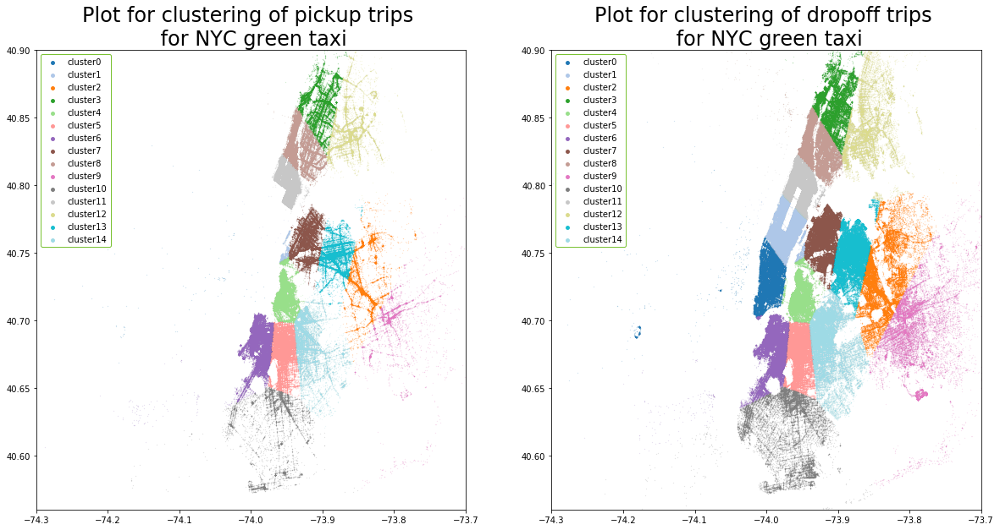

In [24]:
plot_cluster(cl_green_df, 'green', centroid_green, plot_centroid = False)

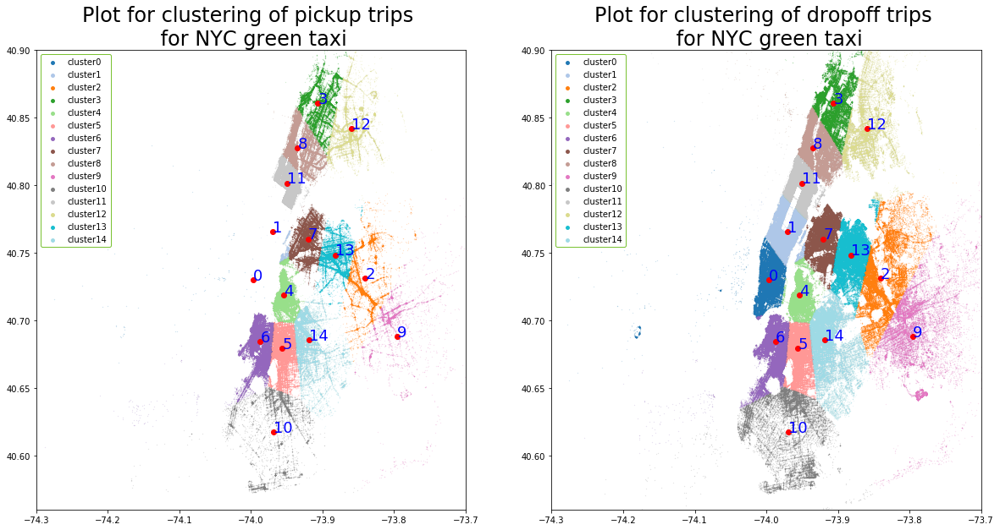

In [25]:
plot_cluster(cl_green_df, 'green', centroid_green, plot_centroid = True)

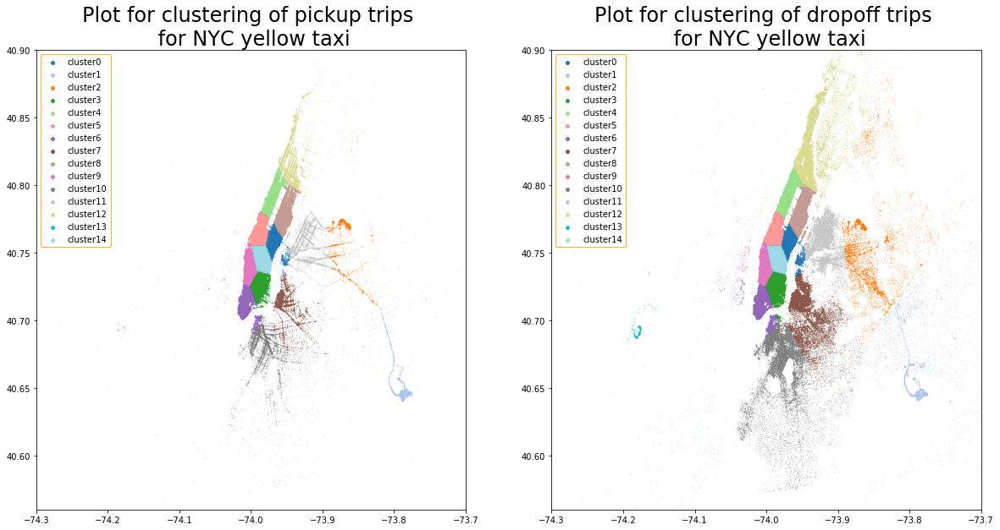

In [17]:
plot_cluster(cl_yellow_df, 'yellow', centroid_yellow, plot_centroid = False)

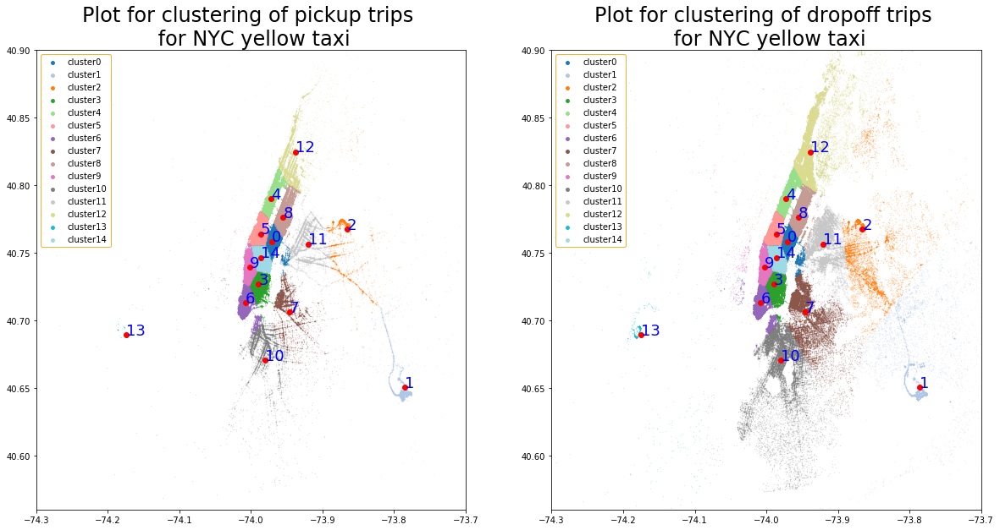

In [18]:
plot_cluster(cl_yellow_df, 'yellow', centroid_yellow, plot_centroid = True)

### 1.2.2 Joint visualization of pickup and dropoff coordinates

In [55]:
def plot_cluster2(df, taxi, centroid, plot_centroid = False):
    def get_cmap(n, name='tab20'):   ## name = 'hsv'
        return plt.cm.get_cmap(name, n)
    cluster_n = len(df.pick_cl.unique())
    cl_to_label_dict = {i:'cluster'+str(i) for i in np.arange(cluster_n)}
    colors = {'green':'#59b300', 'yellow':'#ff9900'}
    color_list = get_cmap(cluster_n, name = 'tab20')
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(10,10))
    for i in np.arange(15):
        ax.scatter(np.array(df[df.pick_cl == i].pickup_longitude), np.array(df[df.pick_cl == i].pickup_latitude), marker='.', alpha = 0.3, s = 0.3, color = color_list(i), label=cl_to_label_dict[i])
        ax.scatter(np.array(df[df.drop_cl == i].dropoff_longitude), np.array(df[df.drop_cl == i].dropoff_latitude), marker='.', alpha = 0.3, s = 0.3, color = color_list(i))
    
    leg = ax.legend(loc = 'upper left', edgecolor = colors[taxi])
    for lh in leg.legendHandles: 
        lh.set_alpha(1)
        lh._sizes = [60]
    
    ax.set_xlim((LL[0], LL[1]))
    ax.set_ylim(LL[2], LL[3])
    ax.set_title(f'Plot for clustering of pickup and dropoff coordinates \n for NYC {taxi} taxi'.format(taxi), fontsize = 20)
    
    if plot_centroid:
        for i in df.pick_cl.unique():
            ax.plot(centroid.centroid_pick_long[centroid.pick_cl == i], centroid.centroid_pick_lat[centroid.pick_cl == i], 'o', color = 'r')
            ax.annotate(i, (centroid.centroid_pick_long[centroid.pick_cl == i], centroid.centroid_pick_lat[centroid.pick_cl == i]), color = 'b', fontsize = 18)
            

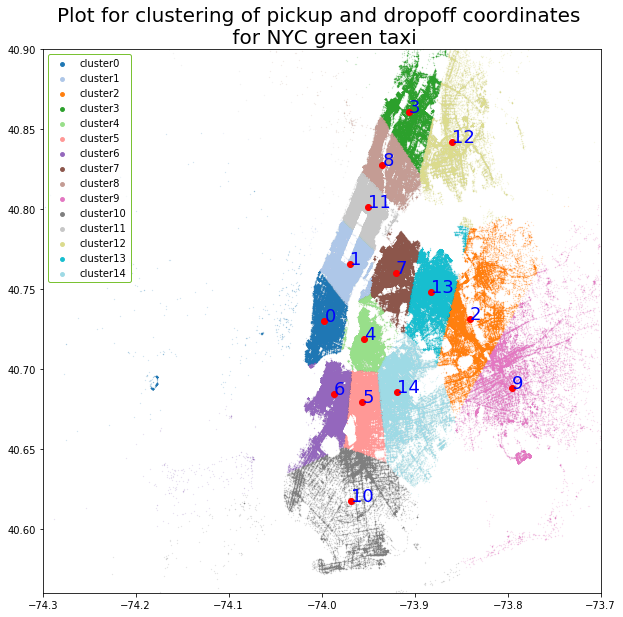

In [56]:
plot_cluster2(cl_green_df, 'green', centroid_green, plot_centroid = True)

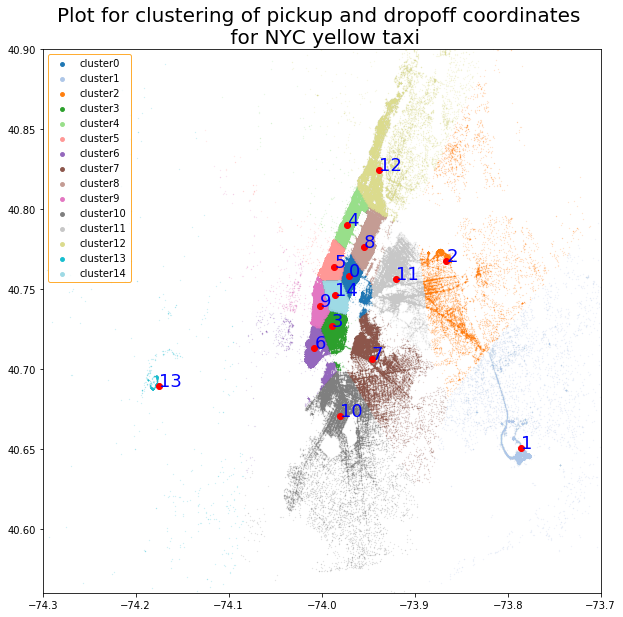

In [57]:
plot_cluster2(cl_yellow_df, 'yellow', centroid_yellow, plot_centroid = True)

### 1.2.3 Visualization of cluster interaction (taxi trips outbound and inbound between each pair of clusters)

Here I create an animation showing the taxi trips running between each pair of clusters as well as the trip direction. The width of arrows indicates the relative hourly traffic flow between each cluster. The dots indicate relative trip density in each area. 

In [37]:
def build_gif_hour_cluster(df, centroid, taxi, title, save_path):
    colors = {'green':'#59b300', 'yellow':'#ff9900'}
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(10,10))
    #ax.set_axis_off()
    def show_im(hour):
        ax.clear()
        ax.set_title(title + str(hour) + ':00', fontsize=18)
        df_hour = df[df.hour == hour]
        ax.plot(df_hour.pickup_longitude, df_hour.pickup_latitude, '.', alpha = 0.3, markersize = 0.5, color = 'gray', zorder=0)
        ax.plot(centroid.centroid_pick_long, centroid.centroid_pick_lat, 'o', color = 'r')
        ax.set_xlim((LL[0], LL[1]))
        ax.set_ylim((LL[2], LL[3]))
        for i in df.pick_cl.unique():
            for j in df.drop_cl.unique():
                num_of_rides = len(df[(df.pick_cl == i)&(df.drop_cl == j)&(df.hour == hour)])
                dist_x = centroid.centroid_pick_long[centroid.pick_cl == i].values[0] - centroid.centroid_pick_long[centroid.pick_cl == j].values[0]
                dist_y = centroid.centroid_pick_lat[centroid.pick_cl == i].values[0] - centroid.centroid_pick_lat[centroid.pick_cl == j].values[0]
                pct = np.true_divide(num_of_rides,df.shape[0])
                #arr = Arrow(centroid.centroid_pick_long[centroid.pick_cl == i].values, centroid.centroid_pick_lat[centroid.pick_cl == i].values, -dist_x, -dist_y, edgecolor='white', width = 30*pct)
                arr = Arrow(centroid.centroid_pick_long[centroid.pick_cl == i].values, centroid.centroid_pick_lat[centroid.pick_cl == i].values, -dist_x, -dist_y, width = 15*pct, zorder=2)
                ax.add_patch(arr)
                arr.set_facecolor(colors[taxi])
        #ax.set_axis_off()
    im_ani = animation.FuncAnimation(fig, show_im, sorted(df.hour.unique()),interval=500, blit=False, repeat = True)
    plt.close()
    im_ani.save(save_path, writer='imagemagick') #, writer='imagemagick'
    return   

In [34]:
save_path = 'animation/green_taxi_cluster1_hour.gif'
build_gif_hour_cluster(cl_green_df, centroid_green, 'green', 'Absolute Traffic for NYC green taxi - Hour ', save_path)


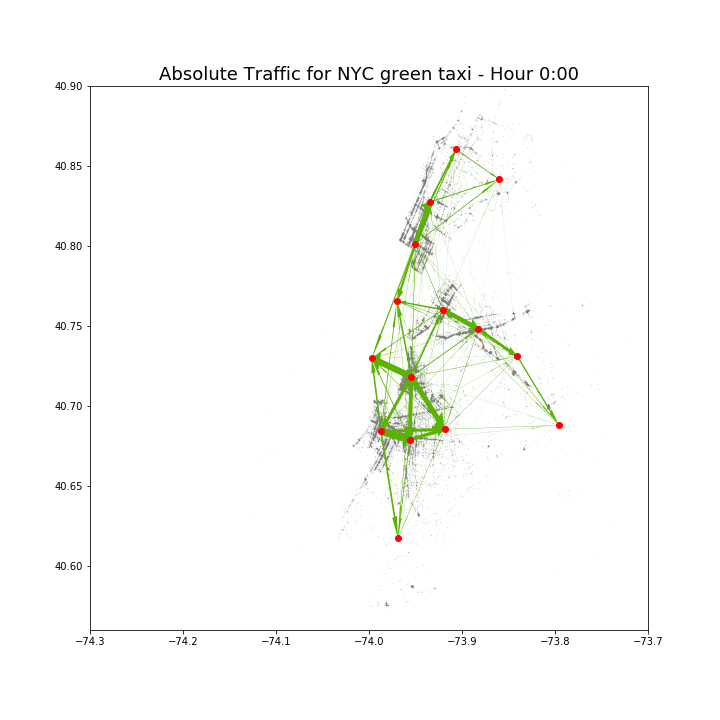

In [35]:
filename = 'animation/green_taxi_cluster1_hour.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [40]:
save_path = 'animation/yellow_taxi_cluster1_hour.gif'
build_gif_hour_cluster(cl_yellow_df, centroid_yellow, 'yellow', 'Absolute Traffic for NYC yellow taxi - Hour ', save_path)


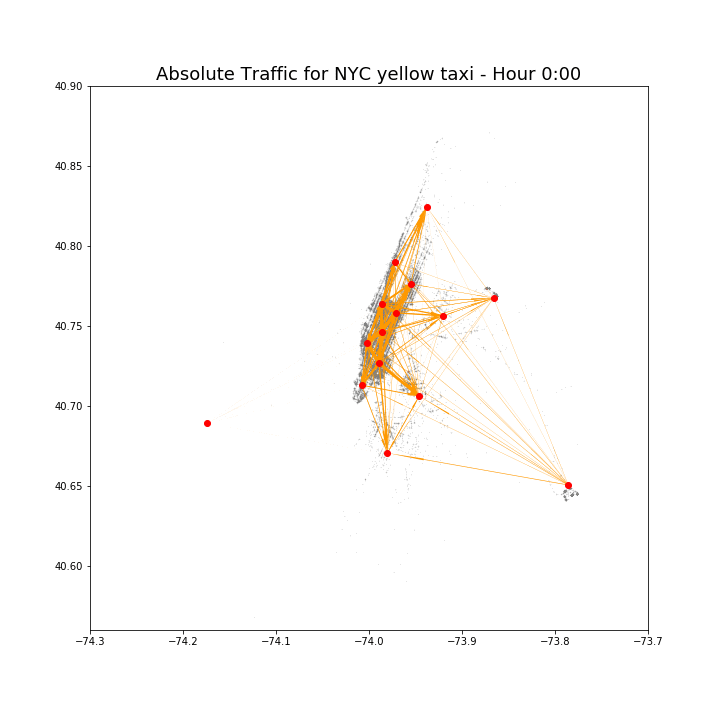

In [41]:
filename = 'animation/yellow_taxi_cluster1_hour.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

Next, I will plot each cluster in different colors as in section 1.2.1 and 1.2.2

In [42]:
def build_gif_hour_cluster_col(df, centroid, cluster_n, taxi, title, arrow_col, save_path):
    def get_cmap(n, name='tab20'):   ## name = 'hsv'
        return plt.cm.get_cmap(name, n)
    
    cl_to_label_dict = {i:'cluster'+str(i) for i in np.arange(cluster_n)}
    color_list = get_cmap(cluster_n, name = 'tab20')
    
    colors = {'green':'#59b300', 'yellow':'#ff9900'}
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(10,10))
    #ax.set_axis_off()
    def show_im(hour):
        ax.clear()
        ax.set_title(title + str(hour) + ':00', fontsize=18)
        df_hour = df[df.hour == hour]
        ax.plot(centroid.centroid_pick_long, centroid.centroid_pick_lat, 'o', color = 'r')
        ax.set_xlim((LL[0], LL[1]))
        ax.set_ylim((LL[2], LL[3]))
        
        for i in np.arange(cluster_n):
            ax.scatter(np.array(df_hour[df_hour.pick_cl == i].pickup_longitude), np.array(df_hour[df_hour.pick_cl == i].pickup_latitude), marker='.', alpha = 0.3, s = 0.5, color = color_list(i), label=cl_to_label_dict[i], zorder=0)
            ax.scatter(np.array(df_hour[df_hour.drop_cl == i].dropoff_longitude), np.array(df_hour[df_hour.drop_cl == i].dropoff_latitude), marker='.', alpha = 0.3, s = 0.5, color = color_list(i), zorder=0)
        
        leg = ax.legend(loc = 'upper left', edgecolor = colors[taxi])
        for lh in leg.legendHandles: 
            lh.set_alpha(1)
            lh._sizes = [60]
        
        for i in np.arange(cluster_n):
            for j in np.arange(cluster_n):
                num_of_rides = len(df[(df.pick_cl == i)&(df.drop_cl == j)&(df.hour == hour)])
                dist_x = centroid.centroid_pick_long[centroid.pick_cl == i].values[0] - centroid.centroid_pick_long[centroid.pick_cl == j].values[0]
                dist_y = centroid.centroid_pick_lat[centroid.pick_cl == i].values[0] - centroid.centroid_pick_lat[centroid.pick_cl == j].values[0]
                pct = np.true_divide(num_of_rides,df.shape[0])
                #arr = Arrow(centroid.centroid_pick_long[centroid.pick_cl == i].values, centroid.centroid_pick_lat[centroid.pick_cl == i].values, -dist_x, -dist_y, edgecolor='white', width = 30*pct)
                arr = Arrow(centroid.centroid_pick_long[centroid.pick_cl == i].values, centroid.centroid_pick_lat[centroid.pick_cl == i].values, -dist_x, -dist_y, width = 15*pct, zorder=2)
                ax.add_patch(arr)
                arr.set_facecolor(arrow_col)
        
        #ax.set_axis_off()
    im_ani = animation.FuncAnimation(fig, show_im, sorted(df.hour.unique()),interval=500, blit=False, repeat = True)
    plt.close()
    im_ani.save(save_path, writer='imagemagick') #, writer='imagemagick'
    return   

In [43]:
save_path = 'animation/green_taxi_cluster1_hour_col.gif'
build_gif_hour_cluster_col(df=cl_green_df, centroid=centroid_green, cluster_n=15, taxi='green', title='Absolute Traffic for NYC green taxi - Hour ', arrow_col='#59b300', save_path=save_path)


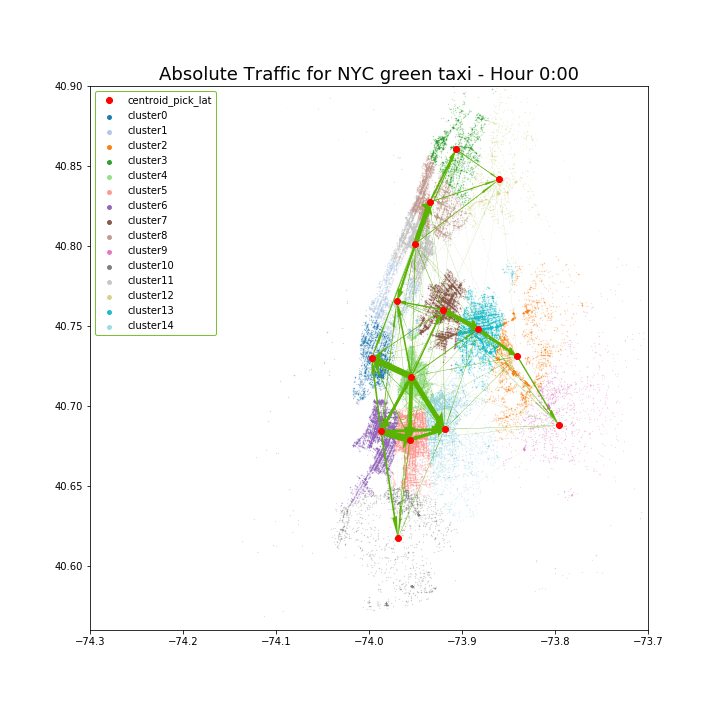

In [46]:
filename = 'animation/green_taxi_cluster1_hour_col.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [47]:
save_path = 'animation/yellow_taxi_cluster1_hour_col.gif'
build_gif_hour_cluster_col(df=cl_yellow_df, centroid=centroid_yellow, cluster_n=15, taxi='yellow', title='Absolute Traffic for NYC yellow taxi - Hour ', arrow_col='purple', save_path=save_path)


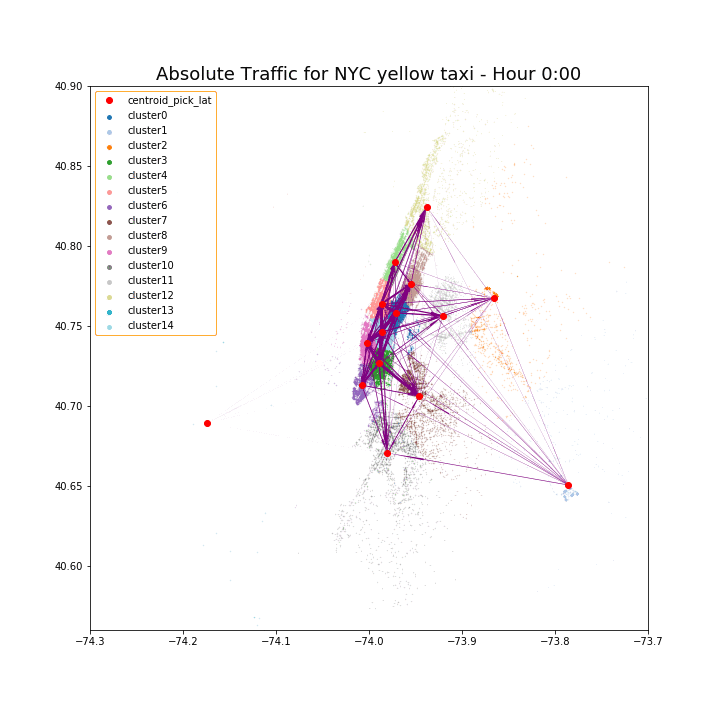

In [48]:
filename = 'animation/yellow_taxi_cluster1_hour_col.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

## 1.3 Neighborhood interactions

### 1.3.1 Taxi trip interactions between each neighborhood/ cluster

The animated maps above give a temporal presentation of the taxi trips outbound and inbound from each cluster, but the information provided is not very quantitative. Here I create a heatmap showing the number of trips running between each pair of clustered neighborhood as well as the trip direction. 

In [10]:
import itertools
def plot_trip_summary(cm, classes,title='',cmap=plt.cm.Blues):    
    plt.figure(figsize=(12,12))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=20)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90, fontsize=10, fontweight='bold')
    plt.yticks(tick_marks, classes, fontsize=10, fontweight='bold')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if cm[i,j] >= 1000:
            val=np.round(cm[i,j]/1000,1)
            val = str(val)+'k'
        else:
            val = cm[i,j]
        plt.text(j, i, '{}'.format(val), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('FROM', fontsize=18)
    plt.xlabel('TO', fontsize=18)
    plt.tight_layout()

In [11]:
trip_summary_g = cl_green_df.groupby(['pick_cl', 'drop_cl']).count()[['trip_ID']].rename(columns = {'trip_ID': 'number_of_trips'}).unstack(fill_value=0).stack()
trip_summary_g.reset_index(inplace = True)
trip_summary_g_matrix = np.reshape(trip_summary_g.number_of_trips.values, (15,15))

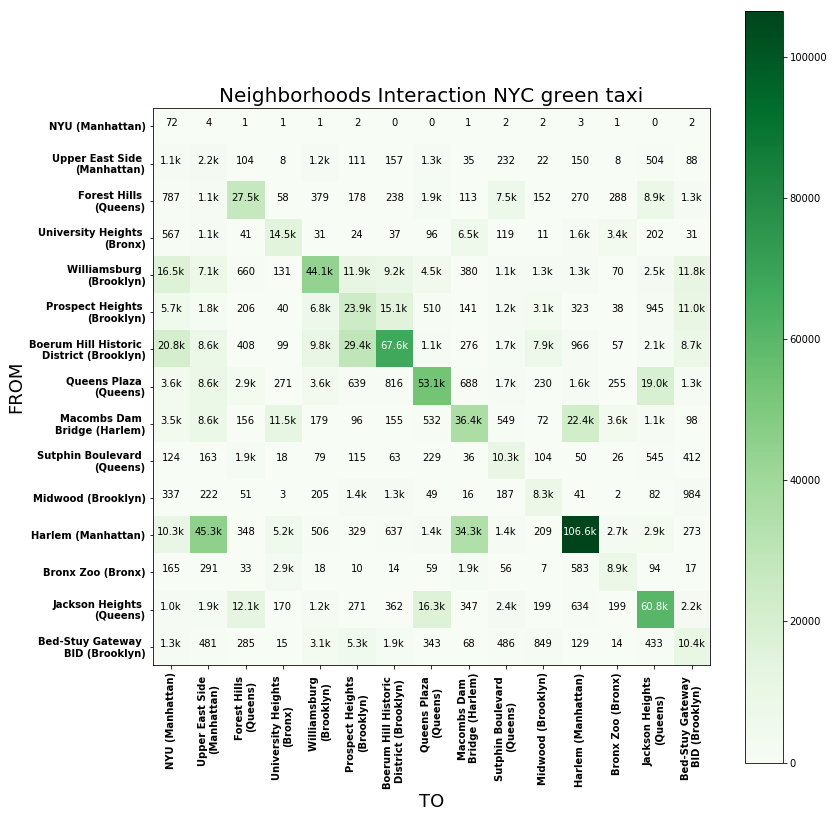

In [12]:
green_cls_label = ['NYU (Manhattan)', 'Upper East Side \n(Manhattan)', 'Forest Hills \n(Queens)','University Heights \n(Bronx)','Williamsburg \n(Brooklyn)', 'Prospect Heights \n(Brooklyn)','Boerum Hill Historic \nDistrict (Brooklyn)','Queens Plaza \n(Queens)','Macombs Dam \nBridge (Harlem)','Sutphin Boulevard \n(Queens)','Midwood (Brooklyn)', 'Harlem (Manhattan)','Bronx Zoo (Bronx)', 'Jackson Heights \n(Queens)','Bed-Stuy Gateway \nBID (Brooklyn)']
#green_cls_label = ['NYU', 'Upper_East', 'Forest Hills','The Bronx \n(University Heights)','McCarren Park \n(Brooklyn)', 'Prospect Park \n(Brooklyn)','Bergen Street \n(Brooklyn)','Queens Plaza','Macombs Dam \nBridge','JFK','Washington Cemetery \n(Brooklyn)', 'Harlem','Bronx Zoo', 'Jackson Heights','Saratoga Park \n(Brooklyn)']
title='Neighborhoods Interaction NYC green taxi'
plot_trip_summary(trip_summary_g_matrix, green_cls_label,title,cmap=plt.cm.Greens)

In [27]:
trip_summary_g_matrix_diag = sum(trip_summary_g_matrix[i][i] for i in np.arange(15))
print('{:.2f}% ({}/{}) green taxi trips run locally'.format(trip_summary_g_matrix_diag/trip_summary_g_matrix.sum()*100, trip_summary_g_matrix_diag, trip_summary_g_matrix.sum()))

47.63% (474622/996380) green taxi trips run locally


In [28]:
trip_summary_y = cl_yellow_df.groupby(['pick_cl', 'drop_cl']).count()[['trip_ID']].rename(columns = {'trip_ID': 'number_of_trips'}).unstack(fill_value=0).stack()
trip_summary_y.reset_index(inplace = True)
trip_summary_y_matrix = np.reshape(trip_summary_y.number_of_trips.values, (15,15))

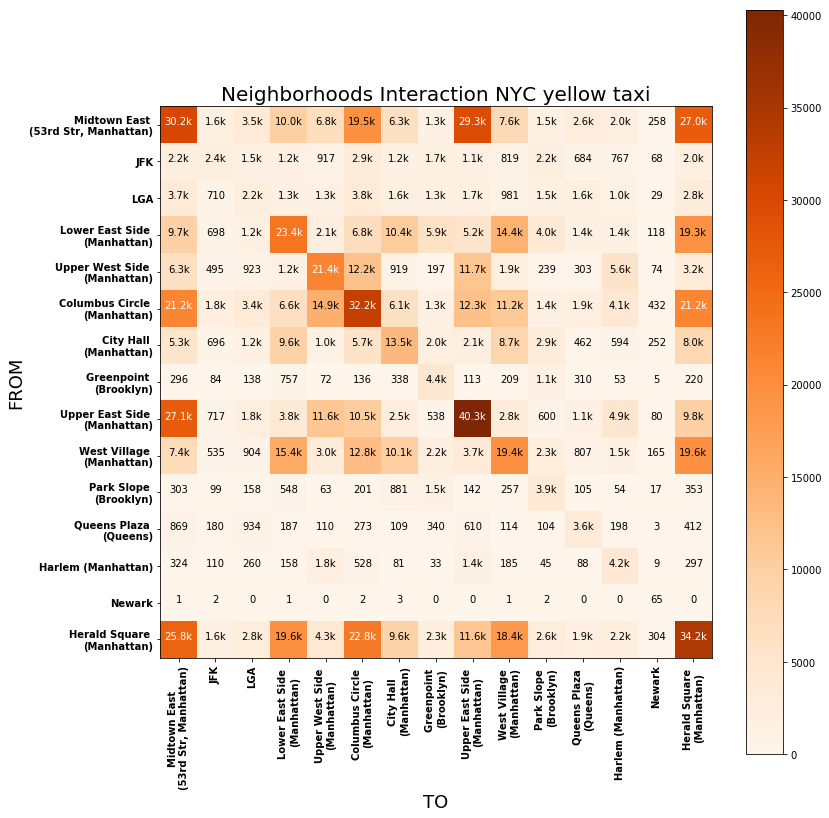

In [29]:
yellow_cls_label = ['Midtown East \n(53rd Str, Manhattan)','JFK','LGA','Lower East Side \n(Manhattan)','Upper West Side \n(Manhattan)','Columbus Circle \n(Manhattan)','City Hall \n(Manhattan)','Greenpoint \n(Brooklyn)', 'Upper East Side \n(Manhattan)','West Village \n(Manhattan)', 'Park Slope \n(Brooklyn)', 'Queens Plaza \n(Queens)', 'Harlem (Manhattan)', 'Newark', 'Herald Square \n(Manhattan)']
title='Neighborhoods Interaction NYC yellow taxi'
plot_trip_summary(trip_summary_y_matrix, yellow_cls_label,title,cmap=plt.cm.Oranges)

In [30]:
trip_summary_y_matrix_diag = sum(trip_summary_y_matrix[i][i] for i in np.arange(15))
print('{:.2f}% ({}/{}) yellow taxi trips run locally'.format(trip_summary_y_matrix_diag/trip_summary_y_matrix.sum()*100, trip_summary_y_matrix_diag, trip_summary_y_matrix.sum()))

23.93% (235413/983697) yellow taxi trips run locally


Based on the heatmap, I have discovered several interesting patterns:

1.A large percentage of the NYC green and yellow taxis run short trips locally, as revealed by the high intensity in the diagonal of the heatmap. 47.63% of green taxi trips and 23.93% of yellow taxi trips run in the same cluster neighborhood.

2.Heatmap for neighborhood interactions of yellow taxi trips has a symmetrical pattern, suggesting that there is an approximately equal number of trips that operate between two areas in either direction.

3.Harlem has a high green taxi density and there are more outbound trips than inbound trips especially in directions towards Upper East Side and Macombs Dam Bridge (connecting Harlem and Bronx).

4.The Upper East Side, midtown and downtown area of Manhattan all have very high yellow taxi density.

### 1.3.2 Outbound and inbound trips in each neighborhood/ cluster

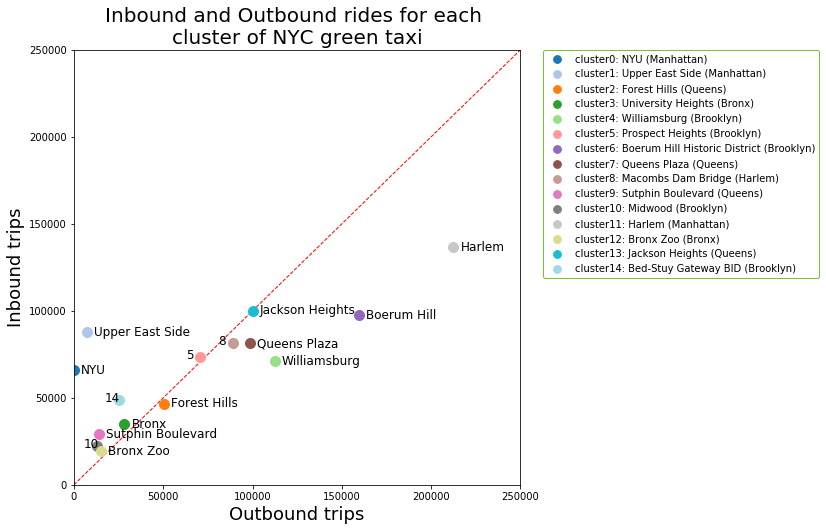

In [53]:
green_cls_label = ['NYU (Manhattan)', 'Upper East Side (Manhattan)', 'Forest Hills (Queens)','University Heights (Bronx)','Williamsburg (Brooklyn)', 'Prospect Heights (Brooklyn)','Boerum Hill Historic District (Brooklyn)','Queens Plaza (Queens)','Macombs Dam Bridge (Harlem)','Sutphin Boulevard (Queens)','Midwood (Brooklyn)', 'Harlem (Manhattan)','Bronx Zoo (Bronx)', 'Jackson Heights (Queens)','Bed-Stuy Gateway BID (Brooklyn)']
green_cls_label2 = ['NYU', 'Upper East Side', 'Forest Hills','Bronx','Williamsburg', 'Prospect Heights','Boerum Hill','Queens Plaza','Macombs Dam Bridge','Sutphin Boulevard','Midwood', 'Harlem','Bronx Zoo', 'Jackson Heights','Bed-Stuy Gateway']
trip_summary = cl_green_df.groupby(['pick_cl', 'drop_cl'], as_index = False).count()[['pick_cl', 'drop_cl', 'trip_ID']].rename(columns = {'trip_ID': 'trip_number'})

trip_summary_pick = trip_summary.groupby(['pick_cl'], as_index = False)[['trip_number']].sum().rename(columns={'trip_number':'outbound'})
trip_summary_drop = trip_summary.groupby(['drop_cl'], as_index = False)[['trip_number']].sum().rename(columns={'trip_number':'inbound'})
trip_summary_total = trip_summary_pick.merge(trip_summary_drop, left_on='pick_cl',right_on='drop_cl')
trip_summary_total['total'] = trip_summary_total.outbound+trip_summary_total.inbound
trip_summary_total['neighborhood'] = np.array(green_cls_label)

def get_cmap(n, name='tab20'):   ## name = 'hsv'
    return plt.cm.get_cmap(name, n)
cluster_n = len(trip_summary_total.pick_cl.unique())
cl_to_label_dict = {i:'cluster'+str(i) for i in np.arange(cluster_n)}
color_list = get_cmap(cluster_n, name = 'tab20')

fig, ax = plt.subplots(1, 1, figsize=(8,8))
for i in np.arange(15):
    ax.scatter(trip_summary_total[trip_summary_total.pick_cl == i].outbound.item(), 
               trip_summary_total[trip_summary_total.pick_cl == i].inbound.item(), 
               marker='o', alpha = 1, s = 100, color = color_list(i), 
               label='{}: {}'.format(cl_to_label_dict[i], green_cls_label[i]))

    if i in [0,1,2,3,4,6,7,9,11,12,13]:
        ax.annotate(green_cls_label2[i], 
                (trip_summary_total[trip_summary_total.pick_cl == i].outbound.item()+4000, 
                 trip_summary_total[trip_summary_total.pick_cl == i].inbound.item()-2000), 
                fontsize = 12)
        
    else:   
        ax.annotate(str(i), 
                (trip_summary_total[trip_summary_total.pick_cl == i].outbound.item()-8000, 
                 trip_summary_total[trip_summary_total.pick_cl == i].inbound.item()-1000), 
                fontsize = 12)
    
ax.plot([0,250000],[0,250000], color = 'r', linewidth = 1, zorder=0, ls = '--')
ax.set_xlim([0,250000])
ax.set_ylim([0,250000])
ax.set_xlabel('Outbound trips',fontsize=18)
ax.set_ylabel('Inbound trips',fontsize=18)
ax.set_title('Inbound and Outbound rides for each \ncluster of NYC green taxi', fontsize=20)    

leg1 = ax.legend(edgecolor = '#59b300', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for lh in leg1.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [60]

The number of outbound and inbound green taxi trips for some areas is not balanced. Upper East Side has more inbound trips and NYU area only has inbound trips, which is consistent with the regulation that green taxi is not allowed to pick up passengers below West 110th and East 96th streets in Manhattan. Williamsburg, Boerum Hill, and Harlem have more outbound trips than inbounds, which suggests that people may prefer to take public transportation heading towards these areas but leave by taking a taxi. This is also consistent with the heatmap plotted above that Harlem has more outbound trips running towards Upper East Side and Macombs Dam Bridge (connecting Harlem and Bronx).

In addition, both Jackson Heights and Queens Plaza have an equal large number of inbound and outbound trips. 

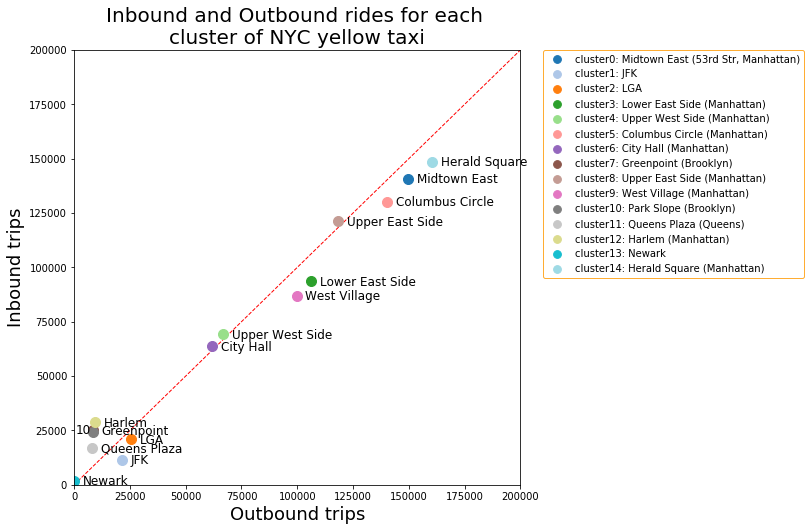

In [100]:
yellow_cls_label = ['Midtown East (53rd Str, Manhattan)','JFK','LGA','Lower East Side (Manhattan)','Upper West Side (Manhattan)','Columbus Circle (Manhattan)','City Hall (Manhattan)','Greenpoint (Brooklyn)', 'Upper East Side (Manhattan)','West Village (Manhattan)', 'Park Slope (Brooklyn)', 'Queens Plaza (Queens)', 'Harlem (Manhattan)', 'Newark', 'Herald Square (Manhattan)']
yellow_cls_label2 = ['Midtown East','JFK','LGA','Lower East Side ','Upper West Side','Columbus Circle','City Hall','Greenpoint', 'Upper East Side','West Village', 'Park Slope', 'Queens Plaza', 'Harlem', 'Newark', 'Herald Square']
#yellow_cls_label = ['Midtown East','JFK','LGA','East Village','Upper West Side','Columbus Circle','Brooklyn Bridge-City Hall','East Williamsburg (Brooklyn)', 'Upper East Side','Chelsea and West Village', 'Prospect Park (Brooklyn)', 'Queens Plaza', 'Harlem', 'Newark', 'Herald Square']
trip_summary = cl_yellow_df.groupby(['pick_cl', 'drop_cl'], as_index = False).count()[['pick_cl', 'drop_cl', 'trip_ID']].rename(columns = {'trip_ID': 'trip_number'})

trip_summary_pick = trip_summary.groupby(['pick_cl'], as_index = False)[['trip_number']].sum().rename(columns={'trip_number':'outbound'})
trip_summary_drop = trip_summary.groupby(['drop_cl'], as_index = False)[['trip_number']].sum().rename(columns={'trip_number':'inbound'})
trip_summary_total = trip_summary_pick.merge(trip_summary_drop, left_on='pick_cl',right_on='drop_cl')
trip_summary_total['total'] = trip_summary_total.outbound+trip_summary_total.inbound
trip_summary_total['neighborhood'] = np.array(green_cls_label)

def get_cmap(n, name='tab20'):   ## name = 'hsv'
    return plt.cm.get_cmap(name, n)
cluster_n = len(trip_summary_total.pick_cl.unique())
cl_to_label_dict = {i:'cluster'+str(i) for i in np.arange(cluster_n)}
color_list = get_cmap(cluster_n, name = 'tab20')

fig, ax = plt.subplots(1, 1, figsize=(8,8))
for i in np.arange(15):
    ax.scatter(trip_summary_total[trip_summary_total.pick_cl == i].outbound.item(), 
               trip_summary_total[trip_summary_total.pick_cl == i].inbound.item(), 
               marker='o', alpha = 1, s = 100, color = color_list(i), 
               label='{}: {}'.format(cl_to_label_dict[i], yellow_cls_label[i]))

    if i in [0,1,2,3,4,5,6,7,8,9,11,12,13,14]:
        ax.annotate(yellow_cls_label2[i], 
                (trip_summary_total[trip_summary_total.pick_cl == i].outbound.item()+4000, 
                 trip_summary_total[trip_summary_total.pick_cl == i].inbound.item()-2000), 
                fontsize = 12)
        
    else:   
        ax.annotate(str(i), 
                (trip_summary_total[trip_summary_total.pick_cl == i].outbound.item()-8000, 
                 trip_summary_total[trip_summary_total.pick_cl == i].inbound.item()-1000), 
                fontsize = 12)
    
ax.plot([0,250000],[0,250000], color = 'r', linewidth = 1, zorder=0, ls = '--')
ax.set_xlim([0,200000])
ax.set_ylim([0,200000])
ax.set_xlabel('Outbound trips',fontsize=18)
ax.set_ylabel('Inbound trips',fontsize=18)
ax.set_title('Inbound and Outbound rides for each \ncluster of NYC yellow taxi', fontsize=20)    

leg1 = ax.legend(edgecolor = '#ff9900', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for lh in leg1.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [60]

NYC yellow taxi has a more balanced outbound and inbound trips in each area that aligns well with the diagonal. It's also obvious that hot spots are all located in uptown, midtown and downtown areas in Manhattan, while areas in Harlem, Brooklyn and Queens have a much lower trip density.

# 2. Cluster the taxi trip routes
Route of each taxi trip is determined by the pickup and dropoff coordinate. Apply K-means clustering to both pickup and dropoff coordinates by route (pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude).

In [31]:
def cluster_kmeans2(df, n_clusters, n_init):
    loc_df = df[['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']]
    kmeans = KMeans(n_clusters = n_clusters, n_init=n_init, random_state=2)
    kmeans.fit(loc_df)
    df['cluster'] = kmeans.labels_
    centroid = pd.DataFrame(kmeans.cluster_centers_, columns = ['centroid_pick_long', 'centroid_pick_lat', 'centroid_drop_long', 'centroid_drop_lat'])
    centroid['cluster'] = centroid.index
    df_cl = pd.merge(df, centroid, how = 'left', on = ['cluster'])
    return df_cl, kmeans, centroid

To keep results more comparable with the pickup and dropoff coordinates clustering, I also chose n=15 for route clustering.

### Green taxi routes

In [52]:
cl_green_df_2, kmeans_green_2, centroid_green_2 = cluster_kmeans2(taxi_green_df, n_clusters = 15, n_init = 10)

In [16]:
def get_geocode(coord):
    geolocator = Nominatim()
    addr = geolocator.reverse(coord, timeout=60).address
    if addr == None:
        zipcode = 'NaN'
        zone = 'NaN'
        county = 'NaN'
    else:
        strs = [x.strip() for x in addr.split(',')]
        num = str(re.findall(r"\D(\d{5})\D", addr))
        num = str(filter(str.isdigit, num))[:5]
        zipcode = num
        county = strs[-5]
        if strs[-6]=='Manhattan' or strs[-6]=='BK':
            zone = strs[-7]
        else:
            zone = strs[-6]
    return zipcode+','+zone + ',' + county
 
def get_neighborhood(zone):
    return zone.split(',')[1]
def get_county(zone):
    return zone.split(',')[2]

In [17]:
def centroid_info(centroid_df, cl_df):
    geolocator = Nominatim()
    centroid_df['centroid_pick_long2'] = centroid_df['centroid_pick_long'].astype(str)
    centroid_df['centroid_pick_lat2'] = centroid_df['centroid_pick_lat'].astype(str)
    centroid_df['pickup_coord']=centroid_df[['centroid_pick_lat2', 'centroid_pick_long2']].apply(lambda x: ",".join(x), axis=1)
    centroid_df['centroid_drop_long2'] = centroid_df['centroid_drop_long'].astype(str)
    centroid_df['centroid_drop_lat2'] = centroid_df['centroid_drop_lat'].astype(str)
    centroid_df['dropoff_coord']=centroid_df[['centroid_drop_lat2', 'centroid_drop_long2']].apply(lambda x: ",".join(x), axis=1)
    
    centroid_df['pickup_zone'] = centroid_df['pickup_coord'].apply(get_geocode)
    centroid_df['pickup_neighborhood'] = centroid_df['pickup_zone'].apply(get_neighborhood)
    centroid_df['pickup_county'] = centroid_df['pickup_zone'].apply(get_county)
    centroid_df['dropoff_zone'] = centroid_df['dropoff_coord'].apply(get_geocode)
    centroid_df['dropoff_neighborhood'] = centroid_df['dropoff_zone'].apply(get_neighborhood)
    centroid_df['dropoff_county'] = centroid_df['dropoff_zone'].apply(get_county)
    
    cl_df_summary = cl_df.groupby(['cluster'], as_index=False).count()[['cluster', 'trip_ID']].rename(columns = {'trip_ID': 'trip_number'})
    centroid_df = centroid_df.merge(cl_df_summary, left_on = 'cluster', right_on = 'cluster')
    centroid_df = centroid_df.drop(['pickup_coord', 'dropoff_coord', 'pickup_zone', 'dropoff_zone','centroid_pick_long2','centroid_pick_lat2','centroid_drop_long2','centroid_drop_lat2'], axis=1)
    return centroid_df
    

In [20]:
centroid_green_2 = centroid_info(centroid_green_2, cl_green_df_2)

In [52]:
centroid_green_2.sort_values(by='trip_number', ascending = False)

,centroid_pick_long,centroid_pick_lat,centroid_drop_long,centroid_drop_lat,cluster,pickup_neighborhood,pickup_county,dropoff_neighborhood,dropoff_county,trip_number
6,-73.947366,40.805614,-73.949895,40.802951,6,Manhattan Community Board 10,New York County,Manhattan Community Board 10,New York County,173779
12,-73.981033,40.684514,-73.982541,40.678273,12,Boerum Hill,Kings County,Carroll Gardens,Kings County,127641
5,-73.877673,40.744221,-73.876755,40.745927,5,Queens,Queens County,Queens,Queens County,98569
10,-73.918566,40.761233,-73.910461,40.760059,10,Queens,Queens County,Queens,Queens County,91581
2,-73.954382,40.716059,-73.950555,40.710080,2,Williamsburg,Kings County,Williamsburg,Kings County,88337
4,-73.933286,40.827171,-73.922179,40.837463,4,Manhattan Community Board 10,Bronx County,The Bronx,Bronx County,74346
13,-73.951908,40.680979,-73.935937,40.675567,13,Bed-Stuy Gateway Business Improvement District,Kings County,Eastern Parkway,Kings County,70762
9,-73.972569,40.698366,-73.989598,40.734704,9,Fort Greene,Kings County,Manhattan Community Board 5,New York County,64203
1,-73.947499,40.808547,-73.980099,40.757543,1,Manhattan Community Board 10,New York County,Manhattan Community Board 5,New York County,58787
7,-73.832088,40.719784,-73.817991,40.712173,7,Queens,Queens County,Queens,Queens County,47223


**15 routes for NYC green taxi**:

* Route0: Gravesend (Brooklyn) --> Midwood (Brooklyn)
* Route1: Harlem (Manhattan) --> Midtown (Manhattan)
* Route2: Williamsburg (Brooklyn) --> Williamsburg (Brooklyn)
* Route3: Greenpoint (Brooklyn) --> JFK
* Route4: Macombs Dam Bridge (Harlem) --> Yankee Stadium (Bronx)
* Route5: Jackson Heights (Queens) --> Jackson Heights (Queens)
* Route6: Harlem (Manhattan) --> Harlem (Manhattan)
* Route7: Forest Hills (Queens) --> Briarwood (Queens)
* Route8: Clinton Hill (Brooklyn) --> Ditmars Steinway (Queens)
* Route9: Fort Greene (Brooklyn) --> Union Square (Midtown, Manhattan)
* Route10: Astoria (Queens) --> Astoria (Queens)
* Route11: Bronx Zoo (Bronx) --> Bronx Zoo (Bronx)
* Route12: Boerum Hill (Brooklyn) --> Carroll Gardens (Brooklyn)
* Route13: Bed-Stuy Gateway Business Improvement District (Brooklyn) --> Eastern Parkway (Brooklyn)
* Route14: Queens Plaza (Queens) --> Grand Central (Manhattan)

In [50]:
# cl_green_df_2.to_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_route.csv', index = False)
# centroid_green_2.to_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_route_centroid.csv', index = False)
cl_green_df_2 = pd.read_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_route.csv')
centroid_green_2 = pd.read_csv('cluster_kmeans/nyc_taxi_green_2015_combine_1000000_filter_kmeans15_route_centroid.csv')

In [34]:
def build_gif_hour_cluster_route(df, centroid, cluster_n, taxi, title, arrow_col, save_path):
    def get_cmap(n, name='tab20'):   ## name = 'hsv'
        return plt.cm.get_cmap(name, n)
    
    cl_to_label_dict = {i:'cluster'+str(i) for i in np.arange(cluster_n)}
    color_list = get_cmap(cluster_n, name = 'tab20')
    
    colors = {'green':'#59b300', 'yellow':'#ff9900'}
    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(10,10))
    #ax.set_axis_off()
    def show_im(hour):
        ax.clear()
        ax.set_title(title + str(hour) + ':00', fontsize=18)
        df_hour = df[df.hour == hour]
        ax.plot(centroid.centroid_pick_long, centroid.centroid_pick_lat, 'o', color = 'r')
        ax.plot(centroid.centroid_drop_long, centroid.centroid_drop_lat, '*', color = 'b')
        
        ax.set_xlim((LL[0], LL[1]))
        ax.set_ylim((LL[2], LL[3]))
        
        for i in np.arange(cluster_n):
            ax.scatter(np.array(df_hour[df_hour.cluster == i].pickup_longitude), np.array(df_hour[df_hour.cluster == i].pickup_latitude), marker='.', alpha = 0.3, s = 0.5, color = color_list(i), label=cl_to_label_dict[i], zorder=0)
            ax.scatter(np.array(df_hour[df_hour.cluster == i].dropoff_longitude), np.array(df_hour[df_hour.cluster == i].dropoff_latitude), marker='.', alpha = 0.3, s = 0.5, color = color_list(i), zorder=0)
        
        leg = ax.legend(loc = 'upper left', edgecolor = colors[taxi])
        for lh in leg.legendHandles: 
            lh.set_alpha(1)
            lh._sizes = [60]
        
        for i in np.arange(cluster_n):
            num_of_rides = len(df[(df.cluster == i)&(df.hour == hour)])
            dist_x = centroid.centroid_pick_long[centroid.cluster == i].values[0] - centroid.centroid_drop_long[centroid.cluster == i].values[0]
            dist_y = centroid.centroid_pick_lat[centroid.cluster == i].values[0] - centroid.centroid_drop_lat[centroid.cluster == i].values[0]
            pct = np.true_divide(num_of_rides,df.shape[0])
            #arr = Arrow(centroid.centroid_pick_long[centroid.pick_cl == i].values, centroid.centroid_pick_lat[centroid.pick_cl == i].values, -dist_x, -dist_y, edgecolor='white', width = 30*pct)
            arr = Arrow(centroid.centroid_pick_long[centroid.cluster == i].values, centroid.centroid_pick_lat[centroid.cluster == i].values, -dist_x, -dist_y, width = 15*pct, zorder=2)
            ax.add_patch(arr)
            arr.set_facecolor(arrow_col)
        
        #ax.set_axis_off()
    im_ani = animation.FuncAnimation(fig, show_im, sorted(df.hour.unique()),interval=500, blit=False, repeat = True)
    plt.close()
    im_ani.save(save_path, writer='imagemagick') #, writer='imagemagick'
    return   

In [35]:
save_path = 'animation/green_taxi_cluster2_route_15_hour_col.gif'
build_gif_hour_cluster_route(cl_green_df_2, centroid_green_2, 15, 'green', 'Absolute Traffic for NYC green taxi - Hour ', '#59b300', save_path)


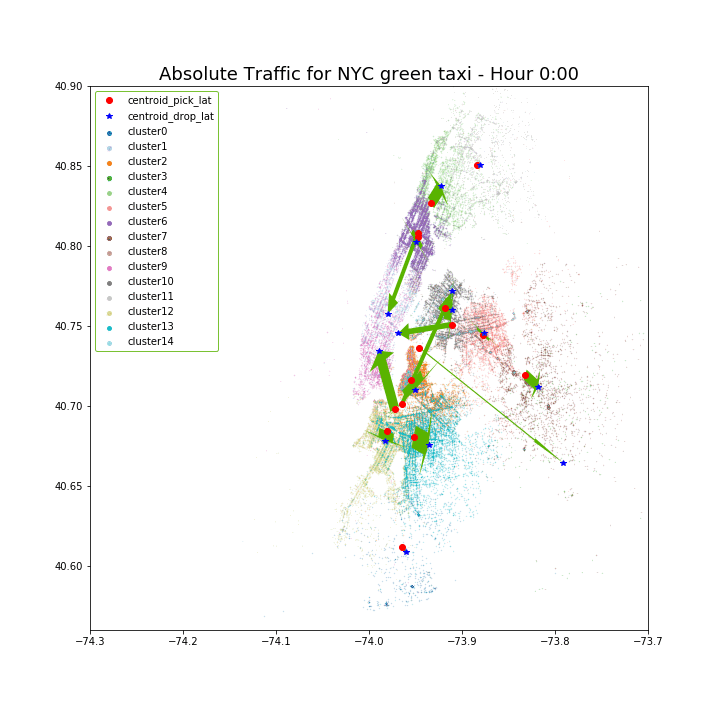

In [36]:
filename = 'animation/green_taxi_cluster2_route_15_hour_col.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

For each route, the 'red' dot indicates the pickup location and the 'blue' star indicates the dropoff location.

The route clustering result is very consistent with the result obtained by clustering pickup and dropoff coordinates together. The most busy route is the Harlem local route, followed by Boerum Hill to Carroll Gardens in Brooklyn and local trips in Jackson Heights, Astoria and Williamsburg. The majority of the top popular routes are short rides that run locally.

### Yellow taxi routes

In [51]:
cl_yellow_df_2, kmeans_yellow_2, centroid_yellow_2 = cluster_kmeans2(taxi_yellow_df, n_clusters = 15, n_init = 10)

In [30]:
centroid_yellow_2 = centroid_info(centroid_yellow_2, cl_yellow_df_2)

In [53]:
centroid_yellow_2.sort_values(by='trip_number', ascending = False)

,centroid_pick_long,centroid_pick_lat,centroid_drop_long,centroid_drop_lat,cluster,pickup_neighborhood,pickup_county,dropoff_neighborhood,dropoff_county,trip_number
6,-73.983338,40.756406,-73.983155,40.756635,6,Manhattan Community Board 5,New York County,Manhattan Community Board 5,New York County,191543
0,-73.996846,40.730469,-73.983607,40.752228,0,Manhattan Community Board 2,Manhattan,Manhattan Community Board 5,New York County,126692
13,-73.998204,40.726212,-73.998832,40.724370,13,Manhattan Community Board 2,New York County,Manhattan Community Board 2,New York County,116502
3,-73.961790,40.775422,-73.976797,40.759185,3,Manhattan Community Board 8,New York County,Manhattan Community Board 5,New York County,108323
4,-73.980924,40.755419,-73.996934,40.727779,4,Manhattan Community Board 5,New York County,Manhattan Community Board 2,New York County,108080
8,-73.981461,40.753531,-73.957674,40.778474,8,Manhattan Community Board 5,New York County,Manhattan Community Board 8,New York County,100027
12,-73.961088,40.783988,-73.958790,40.786610,12,Upper East Side,New York County,Upper East Side,New York County,99439
9,-73.983161,40.721057,-73.962048,40.684470,9,Manhattan Community Board 3,New York County,Clinton Hill,Kings County,37015
7,-73.967138,40.753694,-73.876470,40.760583,7,Manhattan Community Board 6,New York County,Queens,Queens County,24527
5,-73.871433,40.770062,-73.969313,40.747050,5,Queens,Queens County,Manhattan Community Board 6,New York County,24188


**15 routes for NYC yellow taxi**:

* Route0: NYU (Manhattan) --> Bryant Park (Midtown, Manhattan)
* Route1: JFK --> NYU Medical Center (Manhattan)
* Route2: Grand Central (Manhattan) --> JFK
* Route3: Upper East Side (Manhattan) --> Rockefeller Center (Manhattan)
* Route4: Bryant Park (Midtown, Manhattan) --> NYU (Manhattan)
* Route5: LGA --> Grand Central (Manhattan)
* Route6: Diamond District (Midtown, Manhattan) --> Diamond District (Midtown, Manhattan)
* Route7: Grand Central (Manhattan) --> LGA
* Route8: Bryant Park (Midtown, Manhattan) --> Upper East Side (Manhattan)
* Route9: Lower East Side (Manhattan) --> Clinton Hill (Brooklyn)
* Route10: JFK --> Sutphin Blvd-Archer Av-JFK Station
* Route11: Penn Station (Manhattan) --> Newark
* Route12: Central Park (90th Str, Manhattan) --> Central Park (93th Str, Manhattan)
* Route13: NYU (Manhattan) --> SoHo (Manhattan)
* Route14: Central Park (72nd Str, Manhattan) --> The Bronx

In [37]:
# cl_yellow_df_2.to_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_route.csv', index = False)
# centroid_yellow_2.to_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_route_centroid.csv', index = False)
cl_yellow_df_2 = pd.read_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_route.csv')
centroid_yellow_2 = pd.read_csv('cluster_kmeans/nyc_taxi_yellow_2015_combine_1000000_filter_kmeans15_route_centroid.csv')

In [38]:
save_path = 'animation/yellow_taxi_cluster2_route_15_hour_col.gif'
build_gif_hour_cluster_route(cl_yellow_df_2, centroid_yellow_2, 15, 'yellow', 'Absolute Traffic for NYC yellow taxi - Hour ', 'purple', save_path)


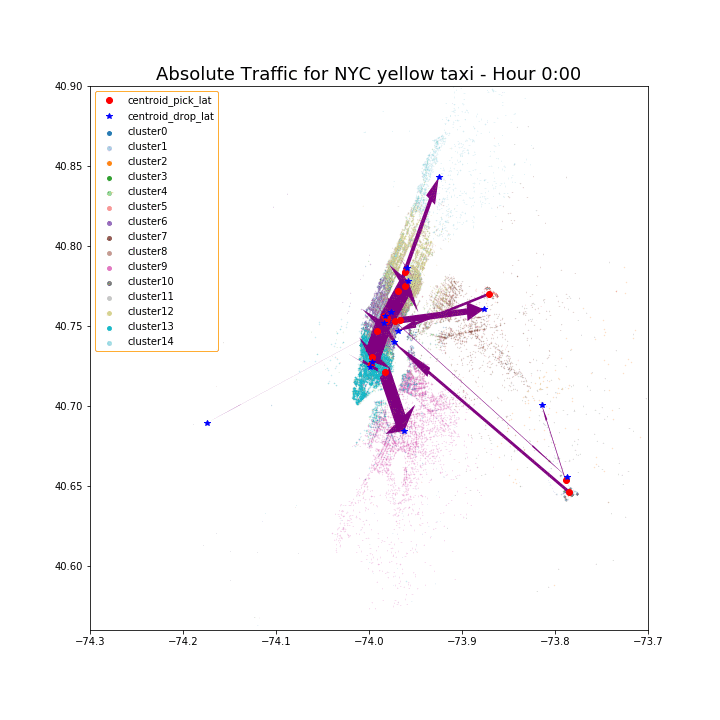

In [39]:
filename = 'animation/yellow_taxi_cluster2_route_15_hour_col.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

Consistent with the previous clustering result, the top7 most popular routes are all running between uptown, midtown and downtown areas in Manhattan. The numbers of trips for routes that have either pickup or dropoff locations outside Manhattan plunge.  

There is also a heavy traffic heading towards or with pickups from JFK and LGA. Newark has a distinct route from Penn Station likely due to the peculiar geographical coordinates of Newark. 